<a href="https://colab.research.google.com/github/ManyaLimbu/X-Ray-Classification/blob/main/X_Ray_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras
from tensorflow.keras.callbacks import EarlyStopping,ModelCheckpoint
import tensorflow as tf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from tqdm import tqdm

In [ ]:
def data(dataset_path):
    images = []
    labels = []
    for subfolder in os.listdir(dataset_path):
        subfolder_path = os.path.join(dataset_path, subfolder)
        if not os.path.isdir(subfolder_path):
            continue
        for image_filename in os.listdir(subfolder_path):
            if image_filename.endswith(".png"):
                image_path = os.path.join(subfolder_path, image_filename)
                images.append(image_path)
                labels.append(subfolder)
    df = pd.DataFrame({'image': images, 'label': labels})
    return df

# New Section

In [ ]:
train=data('/content/drive/MyDrive/hackathonM/TB_Chest_Radiography_Database/train')
train.head()

,image,label
0,/content/drive/MyDrive/hackathonM/TB_Chest_Rad...,Abnormal
1,/content/drive/MyDrive/hackathonM/TB_Chest_Rad...,Abnormal
2,/content/drive/MyDrive/hackathonM/TB_Chest_Rad...,Abnormal
3,/content/drive/MyDrive/hackathonM/TB_Chest_Rad...,Abnormal
4,/content/drive/MyDrive/hackathonM/TB_Chest_Rad...,Abnormal


In [ ]:
test=data('/content/drive/MyDrive/hackathonM/TB_Chest_Radiography_Database/test')
test.head()

,image,label
0,/content/drive/MyDrive/hackathonM/TB_Chest_Rad...,Normal
1,/content/drive/MyDrive/hackathonM/TB_Chest_Rad...,Normal
2,/content/drive/MyDrive/hackathonM/TB_Chest_Rad...,Normal
3,/content/drive/MyDrive/hackathonM/TB_Chest_Rad...,Normal
4,/content/drive/MyDrive/hackathonM/TB_Chest_Rad...,Normal


<Axes: >

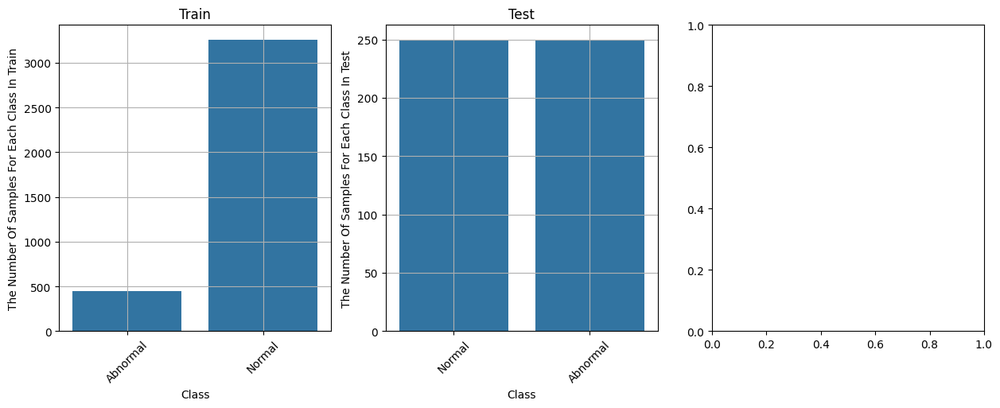

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
ax = sns.countplot(x=train.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Train")
plt.title('Train')
plt.grid(True)
plt.xticks(rotation=45)
plt.subplot(1,3,2)
ax = sns.countplot(x=test.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Test")
plt.title('Test')
plt.grid(True)
plt.xticks(rotation=45)
plt.subplot(1,3,3)
#ax = sns.countplot(x=val.label)
#ax.set_xlabel("Class")
#ax.set_ylabel("The Number Of Samples For Each Class In Val")
#plt.title('Val')
#plt.grid(True)
#plt.xticks(rotation=45)
#plt.show()


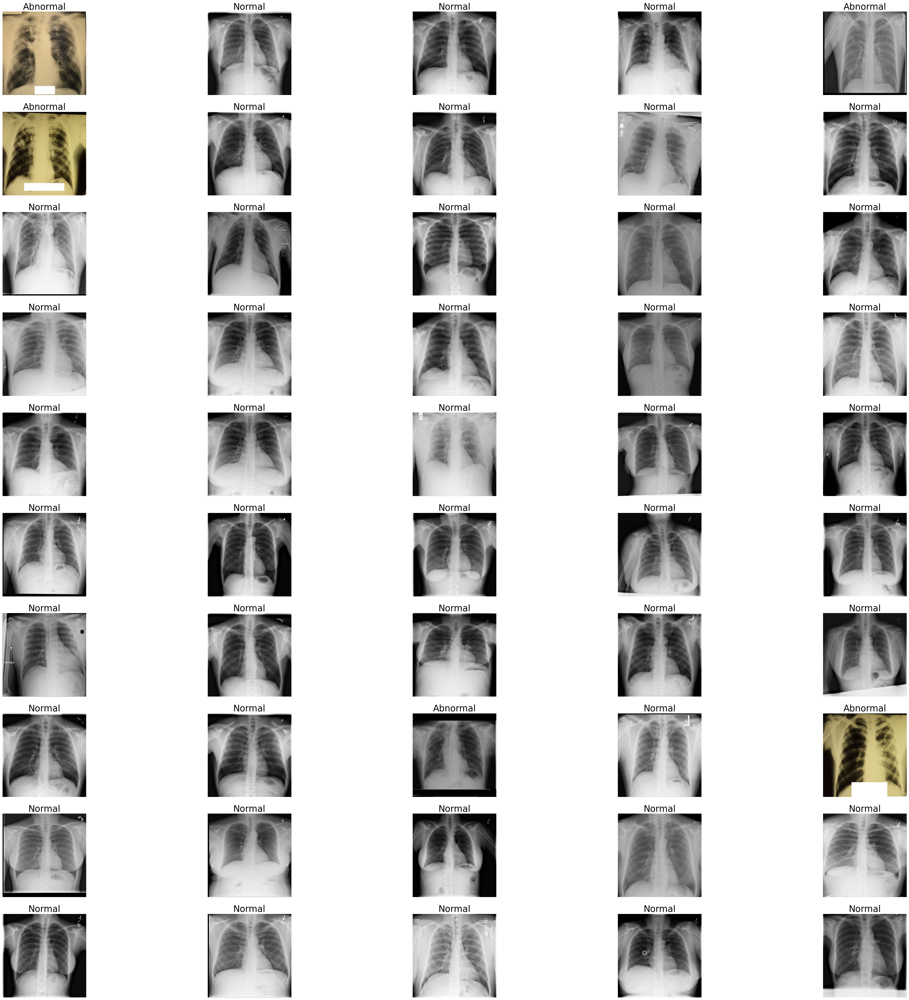

In [ ]:
plt.figure(figsize=(50,50))
for n,i in enumerate(np.random.randint(0,len(train),50)):
    plt.subplot(10,5,n+1)
    img=cv2.imread(train.image[i])
    plt.imshow(img)
    plt.axis('off')
    plt.title(train.label[i],fontsize=25)

In [ ]:
image_size = (224, 224)
batch_size = 32
datagen = ImageDataGenerator(
    rescale=1./255
)
if train['label'].nunique() == 2:
    class_mode = 'binary'
else:
    class_mode = 'categorical'
train_generator = datagen.flow_from_dataframe(
    train,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode=class_mode,
    shuffle=True
)
test_generator = datagen.flow_from_dataframe(
    test,
    x_col='image',
    y_col='label',
    target_size=image_size,
    batch_size=batch_size,
    class_mode='binary',
    shuffle=False
)
#val_generator = datagen.flow_from_dataframe(
 #   val,
 #   x_col='image',
 #   y_col='label',
 #   target_size=image_size,
 #   batch_size=batch_size,
 #   class_mode='binary',
 #   shuffle=True
#)

Found 3709 validated image filenames belonging to 2 classes.
Found 500 validated image filenames belonging to 2 classes.


In [ ]:
class_num=1
model=keras.models.Sequential()
model.add(keras.layers.Conv2D(filters=32, kernel_size=(3,3),activation=tf.nn.relu,input_shape=(224,224,3)))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.MaxPool2D((2,2)))
model.add(keras.layers.Conv2D(filters=64, kernel_size=(3,3),activation=tf.nn.relu))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.MaxPool2D((2,2)))
model.add(keras.layers.Dropout(.3))
model.add(keras.layers.Conv2D(filters=128, kernel_size=(3,3),activation=tf.nn.relu))
model.add(keras.layers.BatchNormalization())
model.add(keras.layers.MaxPool2D((2,2)))
model.add(keras.layers.Dropout(.3))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(256,activation=tf.nn.relu))
model.add(keras.layers.Dropout(.3))
model.add(keras.layers.Dense(128,activation=tf.nn.relu))
model.add(keras.layers.Dropout(.3))
model.add(keras.layers.Dense(class_num,activation=tf.nn.sigmoid))
model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 222, 222, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 222, 222, 32)        │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 111, 111, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 109, 109, 64)        │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 109, 109, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 54, 54, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 52, 52, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 52, 52, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 26, 26, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 86528)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 256)                 │      22,151,424 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 1)                   │             129 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 22,278,593 (84.99 MB)

 Trainable params: 22,278,145 (84.98 MB)

 Non-trainable params: 448 (1.75 KB)

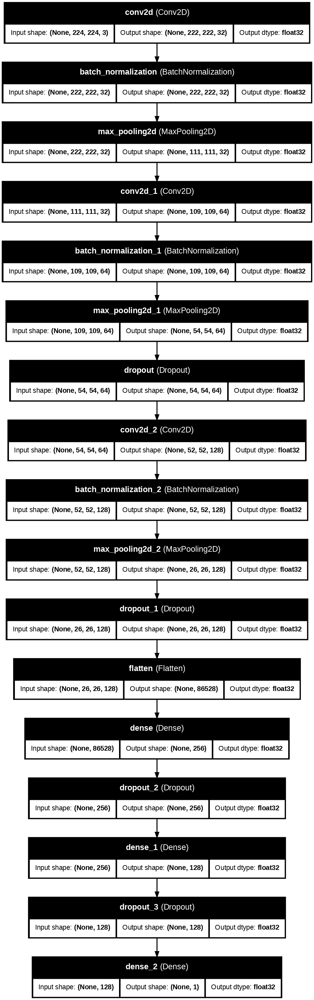

In [ ]:
tf.keras.utils.plot_model(model, to_file='model.png', show_shapes=True, show_layer_names=True,show_dtype=True,dpi=120)

In [ ]:
checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("my_keras_model.keras", save_best_only=True, monitor='loss')
early_stopping_cb = tf.keras.callbacks.EarlyStopping(patience=5, restore_best_weights=True)
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy', tf.keras.metrics.Recall(), 'AUC'])
hist = model.fit(train_generator, epochs=10, callbacks=[checkpoint_cb, early_stopping_cb])


Epoch 1/10


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


116/116 ━━━━━━━━━━━━━━━━━━━━ 840s 7s/step - AUC: 0.8234 - accuracy: 0.9194 - loss: 2.7442 - recall: 0.9536
Epoch 2/10


/usr/local/lib/python3.10/dist-packages/keras/src/callbacks/early_stopping.py:155: UserWarning: Early stopping conditioned on metric `val_loss` which is not available. Available metrics are: AUC,accuracy,loss,recall
  current = self.get_monitor_value(logs)


116/116 ━━━━━━━━━━━━━━━━━━━━ 795s 7s/step - AUC: 0.9136 - accuracy: 0.9600 - loss: 1.0221 - recall: 0.9792
Epoch 3/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 792s 7s/step - AUC: 0.9474 - accuracy: 0.9727 - loss: 0.5896 - recall: 0.9846
Epoch 4/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 789s 7s/step - AUC: 0.9668 - accuracy: 0.9839 - loss: 0.2806 - recall: 0.9922
Epoch 5/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 830s 7s/step - AUC: 0.9814 - accuracy: 0.9871 - loss: 0.1121 - recall: 0.9933
Epoch 6/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 792s 7s/step - AUC: 0.9687 - accuracy: 0.9808 - loss: 0.2537 - recall: 0.9876
Epoch 7/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 797s 7s/step - AUC: 0.9690 - accuracy: 0.9820 - loss: 0.2446 - recall: 0.9890
Epoch 8/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 796s 7s/step - AUC: 0.9824 - accuracy: 0.9932 - loss: 0.1221 - recall: 0.9977
Epoch 9/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 786s 7s/step - AUC: 0.9865 - accuracy: 0.9922 - loss: 0.1025 - recall: 0.9955
Epoch 10/10
116/116 ━━━━━━━━━━━━━━━━━━━━ 802s 7s/step - AUC: 0.9906

In [ ]:
hist_=pd.DataFrame(hist.history)
hist_

,AUC,accuracy,loss,recall
0,0.879087,0.945538,1.959940,0.969623
1,0.930397,0.966029,0.919492,0.980669
2,0.945648,0.971960,0.502350,0.984351
3,0.968641,0.980588,0.286339,0.990181
4,0.982576,0.986519,0.126170,0.992636
5,0.965201,0.980857,0.264475,0.988954
6,0.971049,0.983554,0.234515,0.990181
7,0.977256,0.989215,0.165195,0.995091
8,0.987902,0.992451,0.076777,0.996318
9,0.995093,0.994608,0.035315,0.996625


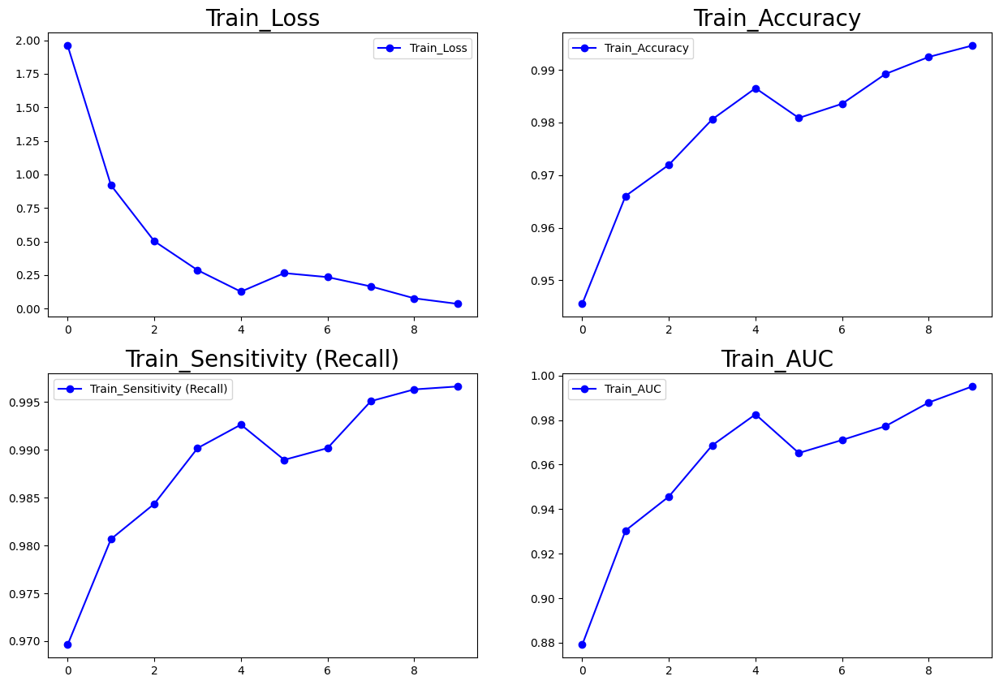

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15,10))

# Plot Train Loss
plt.subplot(2,2,1)
plt.plot(hist.history['loss'], 'b-o', label='Train_Loss')
plt.title('Train_Loss', fontsize=20)
plt.legend()

# Plot Train Accuracy
plt.subplot(2,2,2)
plt.plot(hist.history['accuracy'], 'b-o', label='Train_Accuracy')
plt.title('Train_Accuracy', fontsize=20)
plt.legend()

# Plot Sensitivity (Recall)
plt.subplot(2,2,3)
plt.plot(hist.history['recall'], 'b-o', label='Train_Sensitivity (Recall)')
plt.title('Train_Sensitivity (Recall)', fontsize=20)
plt.legend()

# Plot AUC
plt.subplot(2,2,4)
plt.plot(hist.history['AUC'], 'b-o', label='Train_AUC')
plt.title('Train_AUC', fontsize=20)
plt.legend()

plt.show()


In [ ]:
score, accuracy, recall,AUC = model.evaluate(test_generator)
print('Test Loss =', score)
print('Test Accuracy =', accuracy)
print('Test Sensitivity =', recall)
print('Test AUC =', AUC)

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


16/16 ━━━━━━━━━━━━━━━━━━━━ 134s 9s/step - AUC: 0.5771 - accuracy: 0.9865 - loss: 0.2015 - recall: 1.0000
Test Loss = 0.4470011293888092
Test Accuracy = 0.9660000205039978
Test Sensitivity = 1.0
Test AUC = 0.9799039959907532


In [ ]:
y_test =test_generator.classes
predictions = model.predict(test_generator)
y_pred = np.where(predictions >= 0.5, 1, 0)
y_test = np.ravel(y_test)
y_pred = np.ravel(y_pred)
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
df

16/16 ━━━━━━━━━━━━━━━━━━━━ 26s 2s/step


,Actual,Prediction
0,1,1
1,1,1
2,1,1
3,1,1
4,1,1
...,...,...
495,0,0
496,0,0
497,0,0
498,0,0


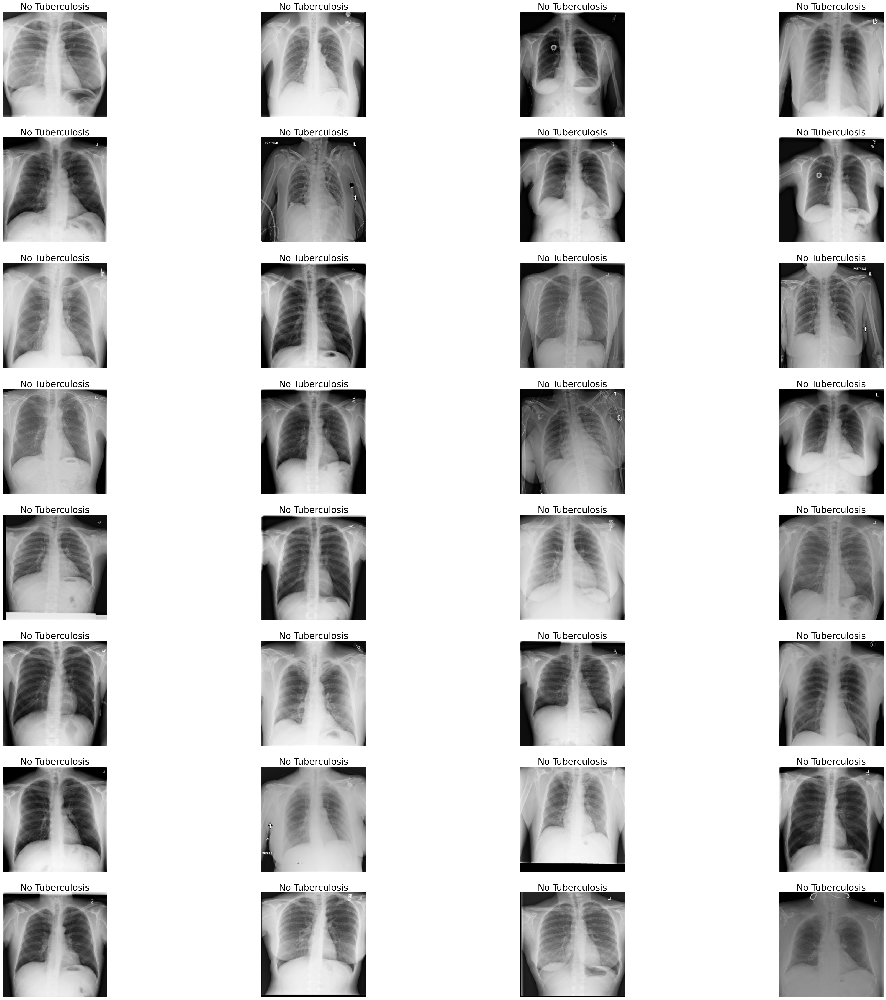

In [ ]:
class_names=['Tuberculosis', 'No Tuberculosis']
batch = next(test_generator)
images= batch[0]
plt.figure(figsize=(50,50))
for n in range(32):
    plt.subplot(8,4,n+1)
    plt.imshow(images[n])
    plt.axis('off')
    plt.title(class_names[int(y_test[n])],fontsize=25)

array([[233,  17],
       [  0, 250]])

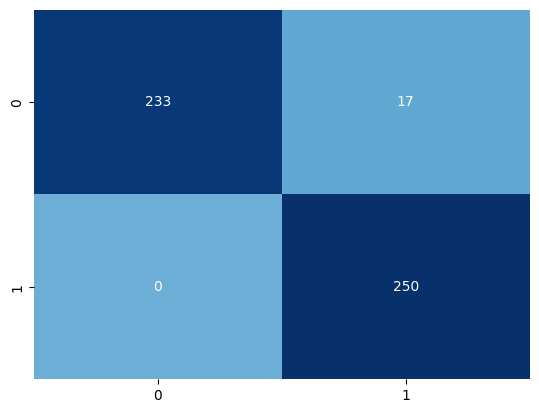

In [ ]:
CM = confusion_matrix(y_test,y_pred)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [ ]:
ClassificationReport = classification_report(y_test,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       1.00      0.93      0.96       250
           1       0.94      1.00      0.97       250

    accuracy                           0.97       500
   macro avg       0.97      0.97      0.97       500
weighted avg       0.97      0.97      0.97       500



In [ ]:
model.save('/content/drive/MyDrive/hackathonM/mymodelML.h5')

In [ ]:
from tensorflow.keras.models import load_model
model = load_model('/content/drive/MyDrive/hackathonM/mymodelML.h5')

In [ ]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import numpy as np
from IPython.display import Image

In [ ]:
from google.colab import files

# Upload one or more images
uploaded = files.upload()

Saving Normal-788.png to Normal-788 (1).png


In [ ]:
# Function to make predictions for an uploaded image
def predict_uploaded_image(uploaded_file):
    #uploaded_file=uploaded_file.resize((224,224))
    img_size = (224, 224)  # Change the target size to match the model's input size

    img = image.load_img(uploaded_file, target_size=img_size)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0

    prediction = model.predict(img_array)
    predicted_class = int(round(prediction[0][0]))  # Get the predicted class (0 or 1)
    tuberculosis_categories = ['abnormal', 'normal']
    predicted_label = tuberculosis_categories[predicted_class]

    # Display the uploaded image and prediction
    # display(Image(uploaded_file))
    print(f'Prediction: {predicted_label}')

    # Get the confidence score for the predicted class
    confidence = float(prediction[0][0])  # Access the single output
    print(f'Confidence: {confidence}')

# Assuming the user uploads only one file
uploaded_file_path = list(uploaded.keys())[0]
predict_uploaded_image(uploaded_file_path)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Prediction: normal
Confidence: 1.0


In [ ]:
model.save('/content/drive/MyDrive/hackathonM/mymodelML.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
!pip install h5py
import h5py
with h5py.File('/content/drive/MyDrive/hackathonM/modelpathh.h5', 'r') as f:  # Replace with your file path
    print(f.keys())
    # Access data within the file
    # ...

<KeysViewHDF5 ['model_weights', 'optimizer_weights']>


In [ ]:
from tensorflow.keras.models import load_model
model = load_model('/content/drive/MyDrive/hackathonM/modelpathh.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
import numpy as np
from IPython.display import Image

In [ ]:
from google.colab import files

# Upload one or more images
uploaded = files.upload()

Saving abnormal a_001.jpg to abnormal a_001.jpg


In [ ]:
from tensorflow.keras.layers import Flatten
# Function to make predictions for an uploaded image
def predict_uploaded_image(uploaded_file):
    img_size = (10,10)  # Change the target size to match the model's expected input shape

    # Load and preprocess the image
    img = image.load_img(uploaded_file, target_size=img_size, color_mode='grayscale')  # Load as grayscale
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array /= 255.0

    # Reshape the image array to match the expected input shape
    img_array = img_array.reshape(1, 100)  # Reshape to (1, 100) to match the total number of elements

    # Make the prediction
    prediction = model.predict(img_array)

    # Assuming your model has a single output neuron for binary classification
    predicted_class = int(round(prediction[0][0]))  # Get the predicted class (0 or 1)
    coronary_categories = ['abnormal', 'normal']
    predicted_label = coronary_categories[predicted_class]

    # Display the uploaded image and prediction
    # display(Image(uploaded_file))
    print(f'Prediction: {predicted_label}')


    # Get the confidence score for the predicted class
    confidence = float(prediction[0][0])  # Access the single output
    print(f'Confidence: {confidence}')

# Assuming the user uploads only one file
uploaded_file_path = list(uploaded.keys())[0]
predict_uploaded_image(uploaded_file_path)

ValueError: Exception encountered when calling Sequential.call().

[1mInput 0 of layer "dense_3" is incompatible with the layer: expected axis -1 of input shape to have value 10, but received input with shape (1, 100)[0m

Arguments received by Sequential.call():
  • inputs=tf.Tensor(shape=(1, 100), dtype=float32)
  • training=False
  • mask=None

In [ ]:
def print_h5_structure(file_path):
    """Prints the structure and contents of an HDF5 file (Keras model)."""
    with h5py.File(file_path, 'r') as f:
        def print_group(name, obj):
            """Recursively prints group and dataset information."""
            if isinstance(obj, h5py.Dataset):
                print(f"Dataset: {name}, Shape: {obj.shape}, Type: {obj.dtype}")
                # You can add code here to print a preview of the data if desired:
                # print(f"Data Preview: {obj[:10]}")  # Prints first 10 elements
            elif isinstance(obj, h5py.Group):
                print(f"Group: {name}")
                for key, value in obj.items():
                    print_group(f"{name}/{key}", value)

        print_group("/", f)  # Start with the root group

# Replace with your model file path
file_path = '/content/drive/MyDrive/hackathonM/modelpathh.h5'
print_h5_structure(file_path)

Group: /
Group: //model_weights
Group: //model_weights/dense_3
Group: //model_weights/dense_3/dense_3
Dataset: //model_weights/dense_3/dense_3/bias:0, Shape: (10,), Type: float32
Dataset: //model_weights/dense_3/dense_3/kernel:0, Shape: (10, 10), Type: float32
Group: //model_weights/dense_4
Group: //model_weights/dense_4/dense_4
Dataset: //model_weights/dense_4/dense_4/bias:0, Shape: (1,), Type: float32
Dataset: //model_weights/dense_4/dense_4/kernel:0, Shape: (10, 1), Type: float32
Group: //model_weights/top_level_model_weights
Group: //optimizer_weights
Dataset: //optimizer_weights/iteration:0, Shape: (), Type: int64
Group: //optimizer_weights/m
Group: //optimizer_weights/m/dense_3
Dataset: //optimizer_weights/m/dense_3/bias:0, Shape: (10,), Type: float32
Dataset: //optimizer_weights/m/dense_3/kernel:0, Shape: (10, 10), Type: float32
Group: //optimizer_weights/m/dense_4
Dataset: //optimizer_weights/m/dense_4/bias:0, Shape: (1,), Type: float32
Dataset: //optimizer_weights/m/dense_4/ke